In [230]:
import cv2
import numpy as np
#import syft
#import pysift
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


In [231]:

sift = cv2.xfeatures2d.SIFT_create()


In [232]:
from numpy import all, any, array, arctan2, cos, sin, exp, dot, log, logical_and, roll, sqrt, stack, trace, unravel_index, pi, deg2rad, rad2deg, where, zeros, floor, full, nan, isnan, round, float32
from numpy.linalg import det, lstsq, norm
from cv2 import resize, GaussianBlur, subtract, KeyPoint, INTER_LINEAR, INTER_NEAREST
from functools import cmp_to_key
import logging

In [233]:
def extract_images_from_folder(folder_path):
    images = []
    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg"):
            image_path = os.path.join(folder_path, filename)
            img = cv2.imread(image_path)
            if img is not None:
                images.append(img)
            else:
                print(f"Unable to read image: {image_path}")
    return images

In [234]:
def extract_images_from_directory(directory_path):
    image_files = []
    for root, dirs, files in os.walk(directory_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_files.append(os.path.join(root, file))
    return image_files

# Example usage:
directory_path = "resized/Camille_Pissarro"
imagesfiles = extract_images_from_directory(directory_path)
print("Found", len(imagesfiles), "images in the directory.")

Found 91 images in the directory.


In [235]:
folder_path = "resized/Camille_Pissarro"
jpg_images = extract_images_from_folder(folder_path)
print(f"Number of .jpg images found: {len(jpg_images)}")

folder_path = "resized"
jpg_images = extract_images_from_folder(folder_path)
print(f"Number of .jpg images found: {len(jpg_images)}")

Number of .jpg images found: 91
Number of .jpg images found: 0


In [236]:
def list_folders_in_directory(directory):
    folders = []
    for item in os.listdir(directory):
        item_path = os.path.join(directory, item)
        if os.path.isdir(item_path):
            folders.append(item_path)
    return folders

In [238]:
directory_path =  "resized"
folders = list_folders_in_directory(directory_path)
for folder in folders:
    folder_path = "resized/Camille_Pissarro"
    jpg_images = extract_images_from_folder(folder)
    print(f"Number of .jpg images found in foler " +folder)
    print({len(jpg_images)})
    print(folder)



Number of .jpg images found in foler resized/Piet_Mondrian
{84}
resized/Piet_Mondrian
Number of .jpg images found in foler resized/Diego_Velazquez
{37}
resized/Diego_Velazquez
Number of .jpg images found in foler resized/Edgar_Degas
{702}
resized/Edgar_Degas
Number of .jpg images found in foler resized/Georges_Seurat
{43}
resized/Georges_Seurat
Number of .jpg images found in foler resized/Francisco_Goya
{291}
resized/Francisco_Goya
Number of .jpg images found in foler resized/Andrei_Rublev
{99}
resized/Andrei_Rublev
Number of .jpg images found in foler resized/Alfred_Sisley
{259}
resized/Alfred_Sisley
Number of .jpg images found in foler resized/Michelangelo
{49}
resized/Michelangelo
Number of .jpg images found in foler resized/Rene_Magritte
{194}
resized/Rene_Magritte
Number of .jpg images found in foler resized/Titian
{255}
resized/Titian
Number of .jpg images found in foler resized/Edouard_Manet
{90}
resized/Edouard_Manet
Number of .jpg images found in foler resized/Giotto_di_Bondon

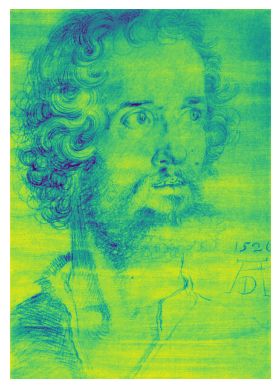

In [239]:
#imagetest="/Users/mh/Downloads/resized/Albert_Durer/Albert_Durer_1.jpg"

def output_image(image_path):
    # Read the image
    image = mpimg.imread(image_path)

    # Display the image
    plt.imshow(image)
    plt.axis('off')  # Turn off axis
    plt.show()
    return image

# Example usage:
image_path = "resized/Albrecht_Durer/Albrecht_Durer_1.jpg"  # Replace with the path to your image
imagetest=output_image(image_path)

11 Features will be extracted from the images

1. Average of HOG (Histogram of Oriented Gradients) feature:

In [240]:
def calculate_average_hog(img):
    hog = cv2.HOGDescriptor()
    hog_features = hog.compute(img)
    avg_hog = np.mean(hog_features)
    return avg_hog

In [241]:
calculate_average_hog(imagetest)

0.15089338

2. Average of LBP (Local Binary Patterns) feature:

In [242]:

from skimage.feature import local_binary_pattern

def calculate_average_lbp(img):
    radius = 3
    num_points = 8 * radius
    lbp = local_binary_pattern(img, num_points, radius, method='uniform')
    avg_lbp = np.mean(lbp)
    return avg_lbp

In [243]:
calculate_average_lbp(imagetest)

19.744469326818674

3. HOG standard deviation:

In [244]:
def calculate_hog_std(img):
    hog = cv2.HOGDescriptor()
    hog_features = hog.compute(img)
    hog_std = np.std(hog_features)
    return hog_std

In [245]:
calculate_hog_std(imagetest)

0.07017599

4. LBP standard deviation:

In [246]:
def calculate_lbp_std(img):
    radius = 3
    num_points = 8 * radius
    lbp = local_binary_pattern(img, num_points, radius, method='uniform')
    lbp_std = np.std(lbp)
    return lbp_std

In [247]:
calculate_lbp_std(imagetest)

9.009434310904847

5) Average of gray histogram


In [248]:
def calculate_gray_histogram(img):
    # Convert the image to grayscale if it's not already
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img  # Already grayscale

    # Calculate histogram of grayscale image
    hist = cv2.calcHist([gray], [0], None, [256], [0, 256])

    # Calculate average gray histogram
    avg_gray_hist = np.mean(hist)
    
    return avg_gray_hist

In [249]:
calculate_gray_histogram(imagetest)

1036.125

6) Average of image edges histogram


In [250]:
def calculate_edge_histogram(img):
    # Convert the image to grayscale if it's not already
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img  # Already grayscale

    # Compute edges using Canny edge detection
    edges = cv2.Canny(gray, 100, 200)

    # Calculate histogram of edges
    hist = cv2.calcHist([edges], [0], None, [256], [0, 256])

    # Calculate average edge histogram
    avg_edge_hist = np.mean(hist)
    
    return avg_edge_hist

In [251]:
calculate_edge_histogram(imagetest)

1036.125

7) Means of image edges features


In [252]:
def calculate_edge_mean(img):
    # Check the number of channels in the image
    if len(img.shape) == 3:
        # Convert the image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img  # If already grayscale, no need to convert

    # Calculate edges using Canny edge detection
    edges = cv2.Canny(gray, 100, 200)

    # Calculate the mean of edges
    edge_mean = np.mean(edges)

    return edge_mean

In [253]:
calculate_edge_mean(imagetest)

26.525968150560985

8) Average  of histogram for S component from HSV color space


In [254]:
def calculate_s_hist_avg(img):
    # Check the number of channels in the image
    if len(img.shape) == 3:
        # Convert the image to the HSV color space
        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        # Split the HSV channels
        h, s, v = cv2.split(hsv)
    elif len(img.shape) == 2:
        # If the image is grayscale, convert it to BGR format
        bgr = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        # Convert the image to the HSV color space
        hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)
        # Split the HSV channels
        h, s, v = cv2.split(hsv)
    else:
        raise ValueError("Input image must have three color channels (BGR) or be grayscale")

    # Calculate the histogram of the saturation channel (S)
    s_hist = cv2.calcHist([s], [0], None, [256], [0, 256])

    # Calculate the average saturation histogram
    avg_s_hist = np.mean(s_hist)

    return avg_s_hist


In [255]:
calculate_s_hist_avg(imagetest)

1036.125

9) Standard deviation of histogram for S component from HSV color space


In [256]:
def calculate_s_hist_std(img):
    # Check the number of channels in the image
    if len(img.shape) == 3:
        # Convert the image to the HSV color space
        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        # Split the HSV channels
        h, s, v = cv2.split(hsv)
    elif len(img.shape) == 2:
        # Convert grayscale image to BGR format
        bgr = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        # Convert the image to the HSV color space
        hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)
        # Split the HSV channels
        h, s, v = cv2.split(hsv)
    else:
        raise ValueError("Input image must have three color channels (BGR) or be grayscale")

    # Calculate the histogram of the saturation channel (S)
    s_hist = cv2.calcHist([s], [0], None, [256], [0, 256])

    # Calculate the standard deviation of the saturation histogram
    s_hist_std = np.std(s_hist)

    return s_hist_std


In [257]:
calculate_s_hist_std(imagetest)

16545.59

10) Average  of histogram for B channel from RGB color space.



In [258]:
def calculate_b_hist_avg(img):
    if len(img.shape) == 3 and img.shape[2] == 3:  # Check if the image is in BGR format
        b, g, r = cv2.split(img)
    elif len(img.shape) == 2:  # Grayscale image
        b = img.copy()
    else:
        raise ValueError("Unsupported image format")
    
    b_hist = cv2.calcHist([b], [0], None, [256], [0, 256])
    total_bins = np.sum(b_hist)
    avg_b_hist = np.mean(b_hist / total_bins)
    
    return avg_b_hist


In [259]:
calculate_b_hist_avg(imagetest)

0.00390625

11) Standard deviation of histogram for B channel from RGB color space.



In [260]:
def calculate_b_hist_std(img):
    if len(img.shape) == 3 and img.shape[2] == 3:  # Check if the image is in BGR format
        b, g, r = cv2.split(img)
    elif len(img.shape) == 2:  # Grayscale image
        b = img.copy()
    else:
        raise ValueError("Unsupported image format")
    
    b_hist = cv2.calcHist([b], [0], None, [256], [0, 256])
    b_hist_std = np.std(b_hist)
    
    return b_hist_std


In [261]:
calculate_b_hist_std(imagetest)

1439.7656

SIFT

In [262]:
def extract_keypoints_and_descriptors(image):
    sift = cv2.SIFT_create()
    # Check the number of channels in the input image
    if len(image.shape) == 2:
        gray = image  # Grayscale image, no need to convert
    elif len(image.shape) == 3 and image.shape[2] == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert color image to grayscale
    else:
        raise ValueError("Invalid input image format")

    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return keypoints, descriptors

In [263]:
keypoints, descriptors = extract_keypoints_and_descriptors(imagetest)
extract_keypoints_and_descriptors(imagetest)

((< cv2.KeyPoint 0x7ff184bb0060>,
  < cv2.KeyPoint 0x7ff184bb0420>,
  < cv2.KeyPoint 0x7ff181dc89c0>,
  < cv2.KeyPoint 0x7ff181dc4420>,
  < cv2.KeyPoint 0x7ff181de1690>,
  < cv2.KeyPoint 0x7ff181de1330>,
  < cv2.KeyPoint 0x7ff181de1bd0>,
  < cv2.KeyPoint 0x7ff181de13f0>,
  < cv2.KeyPoint 0x7ff181de1540>,
  < cv2.KeyPoint 0x7ff181de1420>,
  < cv2.KeyPoint 0x7ff181de1a80>,
  < cv2.KeyPoint 0x7ff181de18a0>,
  < cv2.KeyPoint 0x7ff181de1810>,
  < cv2.KeyPoint 0x7ff181de1390>,
  < cv2.KeyPoint 0x7ff181de1b10>,
  < cv2.KeyPoint 0x7ff181de12d0>,
  < cv2.KeyPoint 0x7ff181de1cf0>,
  < cv2.KeyPoint 0x7ff181de19f0>,
  < cv2.KeyPoint 0x7ff181de1ae0>,
  < cv2.KeyPoint 0x7ff181de1c60>,
  < cv2.KeyPoint 0x7ff181de1570>,
  < cv2.KeyPoint 0x7ff181de1e40>,
  < cv2.KeyPoint 0x7ff181de11b0>,
  < cv2.KeyPoint 0x7ff181de1030>,
  < cv2.KeyPoint 0x7ff181de14b0>,
  < cv2.KeyPoint 0x7ff181de1090>,
  < cv2.KeyPoint 0x7ff181de1c30>,
  < cv2.KeyPoint 0x7ff181de1060>,
  < cv2.KeyPoint 0x7ff181de1360>,
  < cv2.KeyPoi

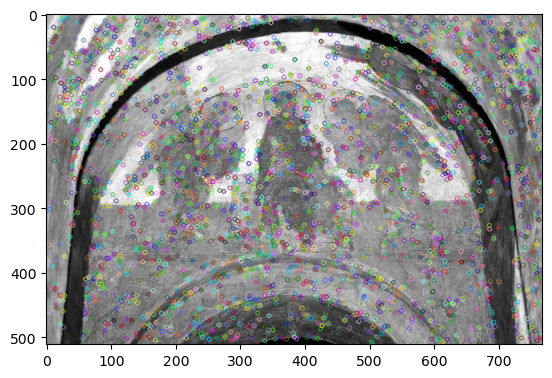

In [268]:
%matplotlib inline

#reading image
img1 = cv2.imread('Andrei_Rublev_5_copy.jpg')  
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

keypoints_descriptors_dict = {}
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

images= extract_images_from_folder("resized/Piet_Mondrian")
for i in images:
    #sift = cv2.xfeatures2d.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(i,None)
    #keypoints_descriptors_dict[i] = {'keypoints': keypoints, 'descriptors': descriptors}



img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)

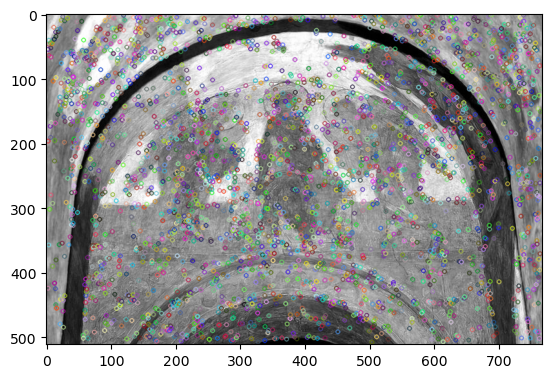

In [270]:

keypoints_descriptors_dict = {}
for image_path in images:
    keypoints, descriptors = extract_keypoints_and_descriptors(image_path)
    keypoints_descriptors_dict[tuple(keypoints)] = {'keypoints': keypoints, 'descriptors': descriptors}


img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)

In [271]:
keypoints_descriptors_dict


{(< cv2.KeyPoint 0x7ff181dd1240>,
  < cv2.KeyPoint 0x7ff181dd12a0>,
  < cv2.KeyPoint 0x7ff181dd1720>,
  < cv2.KeyPoint 0x7ff17ebd89f0>,
  < cv2.KeyPoint 0x7ff17ebd87e0>,
  < cv2.KeyPoint 0x7ff178d8ccf0>,
  < cv2.KeyPoint 0x7ff178d8cea0>,
  < cv2.KeyPoint 0x7ff178d8cf00>,
  < cv2.KeyPoint 0x7ff178d8cde0>,
  < cv2.KeyPoint 0x7ff178d8cf60>,
  < cv2.KeyPoint 0x7ff178d8ce10>,
  < cv2.KeyPoint 0x7ff178d8ced0>,
  < cv2.KeyPoint 0x7ff178d8b090>,
  < cv2.KeyPoint 0x7ff178d8b0c0>,
  < cv2.KeyPoint 0x7ff178d8b0f0>,
  < cv2.KeyPoint 0x7ff178d8b120>,
  < cv2.KeyPoint 0x7ff178d8b150>,
  < cv2.KeyPoint 0x7ff178d8b180>,
  < cv2.KeyPoint 0x7ff178d8b1e0>,
  < cv2.KeyPoint 0x7ff178d8b210>,
  < cv2.KeyPoint 0x7ff178d8b240>,
  < cv2.KeyPoint 0x7ff178d8b270>,
  < cv2.KeyPoint 0x7ff178d8b2a0>,
  < cv2.KeyPoint 0x7ff178d8b2d0>,
  < cv2.KeyPoint 0x7ff178d8b300>,
  < cv2.KeyPoint 0x7ff178d8b330>,
  < cv2.KeyPoint 0x7ff178d8b360>,
  < cv2.KeyPoint 0x7ff178d8b390>,
  < cv2.KeyPoint 0x7ff178d8b3c0>,
  < cv2.KeyPoi

In [272]:
print(keypoints_descriptors_dict)

{(< cv2.KeyPoint 0x7ff181dd1240>, < cv2.KeyPoint 0x7ff181dd12a0>, < cv2.KeyPoint 0x7ff181dd1720>, < cv2.KeyPoint 0x7ff17ebd89f0>, < cv2.KeyPoint 0x7ff17ebd87e0>, < cv2.KeyPoint 0x7ff178d8ccf0>, < cv2.KeyPoint 0x7ff178d8cea0>, < cv2.KeyPoint 0x7ff178d8cf00>, < cv2.KeyPoint 0x7ff178d8cde0>, < cv2.KeyPoint 0x7ff178d8cf60>, < cv2.KeyPoint 0x7ff178d8ce10>, < cv2.KeyPoint 0x7ff178d8ced0>, < cv2.KeyPoint 0x7ff178d8b090>, < cv2.KeyPoint 0x7ff178d8b0c0>, < cv2.KeyPoint 0x7ff178d8b0f0>, < cv2.KeyPoint 0x7ff178d8b120>, < cv2.KeyPoint 0x7ff178d8b150>, < cv2.KeyPoint 0x7ff178d8b180>, < cv2.KeyPoint 0x7ff178d8b1e0>, < cv2.KeyPoint 0x7ff178d8b210>, < cv2.KeyPoint 0x7ff178d8b240>, < cv2.KeyPoint 0x7ff178d8b270>, < cv2.KeyPoint 0x7ff178d8b2a0>, < cv2.KeyPoint 0x7ff178d8b2d0>, < cv2.KeyPoint 0x7ff178d8b300>, < cv2.KeyPoint 0x7ff178d8b330>, < cv2.KeyPoint 0x7ff178d8b360>, < cv2.KeyPoint 0x7ff178d8b390>, < cv2.KeyPoint 0x7ff178d8b3c0>, < cv2.KeyPoint 0x7ff178d8b3f0>, < cv2.KeyPoint 0x7ff178d8b420>, < cv2.